In [1]:
%load_ext autoreload
%autoreload 2
import sys
import os

if not getattr(sys, "_src_path_added", False):
    src_path = os.path.abspath(os.path.join(os.getcwd(), ".."))
    if src_path not in sys.path:
        sys.path.insert(0, src_path)
    sys._src_path_added = True 

In [2]:
from MTGA.MTGA import *

from MTGA.MTGAInstance import Instance
import MTGA.Generators as Generators
import MTGA.Mutators as Mutators
import MTGA.WeightGenerators as WeightGenerators
import MTGA.GeneMutators as GeneMutators
import Fixers as Fixers
import Evaluators as Evaluators

from MTGA.GeneVisualizer import GeneEvolutionRenderer
from Displayer import Displayer

from Utils import *
from MTGA.MTGAUtils import *

## Main Instance

In [3]:
instance = Instance("../problems/p4.json",
    evaluator=Evaluators.CummulativeEvaluator(),
    mutator=Mutators.WalkMutator(),
    generator=Generators.TruncatedNormal(),
    fixer=Fixers.ChoiceFixer(),
    weight_generator=WeightGenerators.SoftmaxWeights(),
    gene_mutator=GeneMutators.Normal())

problem size 10
fire starts [1]
num teams 1


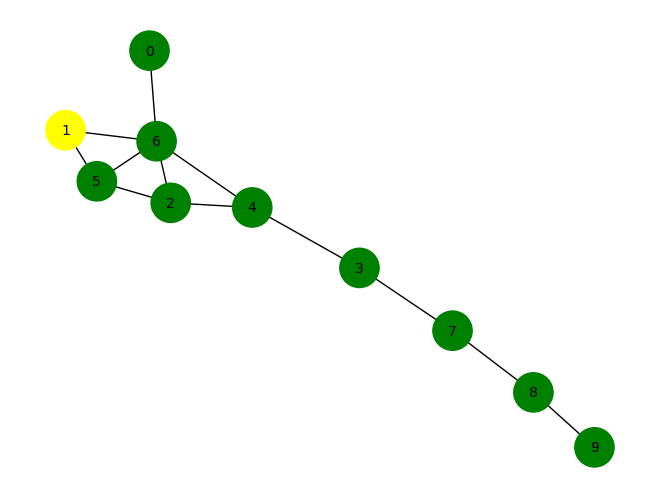

In [4]:
print("problem size", instance.size)
print("fire starts", instance.problem.fire_starts)
print("num teams", instance.problem.num_teams)
draw_graph(instance.problem)

In [5]:
displayer = Displayer()
gene_displayer = GeneEvolutionRenderer()

## The Run

In [6]:
data = optimize_and_collect(instance)

[2025-02-09 18:23:10][  0]     0.06879711     0.06841302 { 12.00000000  23.47400000  42.00000000   9.49027523}
[2025-02-09 18:23:11][  1]     0.13239670     0.06169629 { 12.00000000  23.86000000  42.00000000   9.47567412}
[2025-02-09 18:23:11][  2]     0.20458794     0.06896496 { 12.00000000  24.34200000  42.00000000  10.39177733}
[2025-02-09 18:23:11][  3]     0.28460026     0.07338834 { 12.00000000  25.79200000  42.00000000  10.68478994}
[2025-02-09 18:23:11][  4]     0.36852479     0.07637429 { 12.00000000  25.04200000  42.00000000  10.61415263}
[2025-02-09 18:23:11][  5]     0.43148160     0.06147337 { 12.00000000  25.85000000  42.00000000  10.68417053}
[2025-02-09 18:23:11][  6]     0.49771643     0.06471944 { 12.00000000  24.98600000  42.00000000  10.42371354}
[2025-02-09 18:23:11][  7]     0.56376410     0.06226349 { 12.00000000  26.46600000  42.00000000  11.02999746}
[2025-02-09 18:23:11][  8]     0.62638330     0.05820274 { 12.00000000  26.17400000  42.00000000  10.89218637}
[

In [7]:
solutions = correct_solutions(instance)

## Results

In [8]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [4]:
[4]


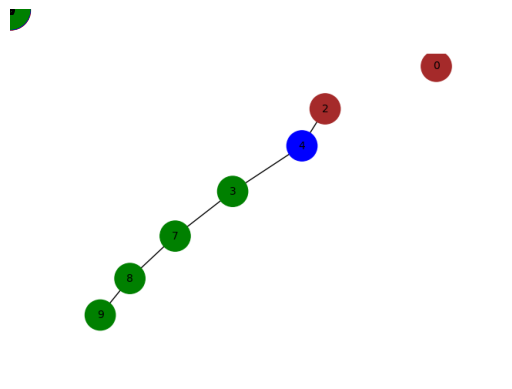

In [9]:
instance.problem.visualize_fire_without_burned(displayer, best_solution)

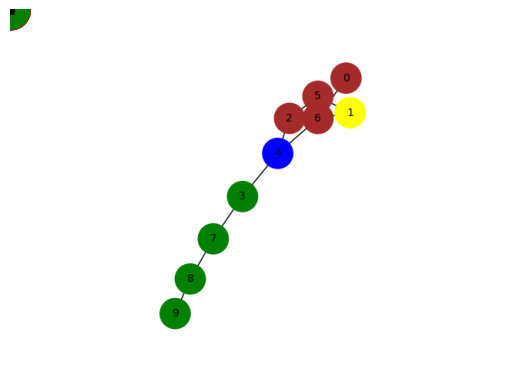

In [10]:
instance.problem.visualize_fires(displayer, solutions)

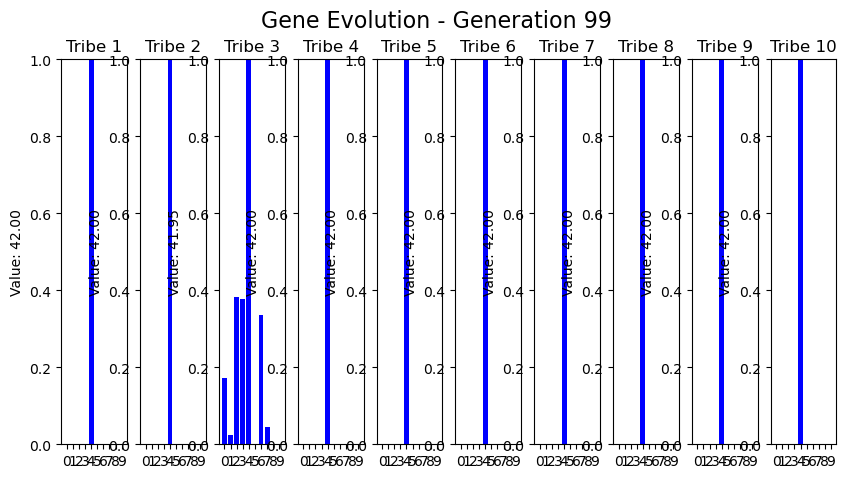

In [11]:
gene_displayer.visualize(data)

## Instance 200

data collected


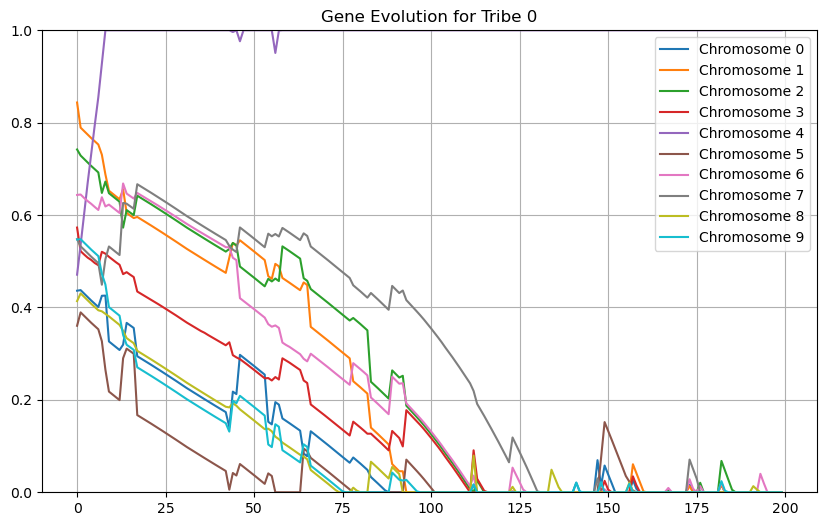

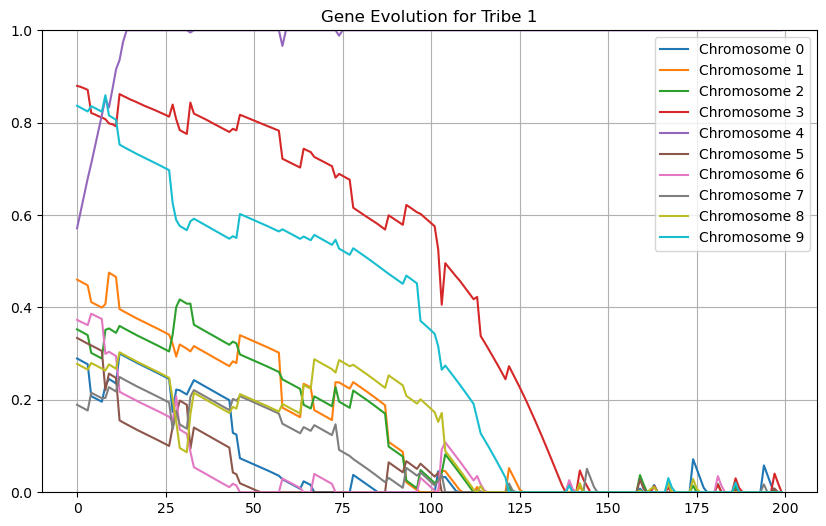

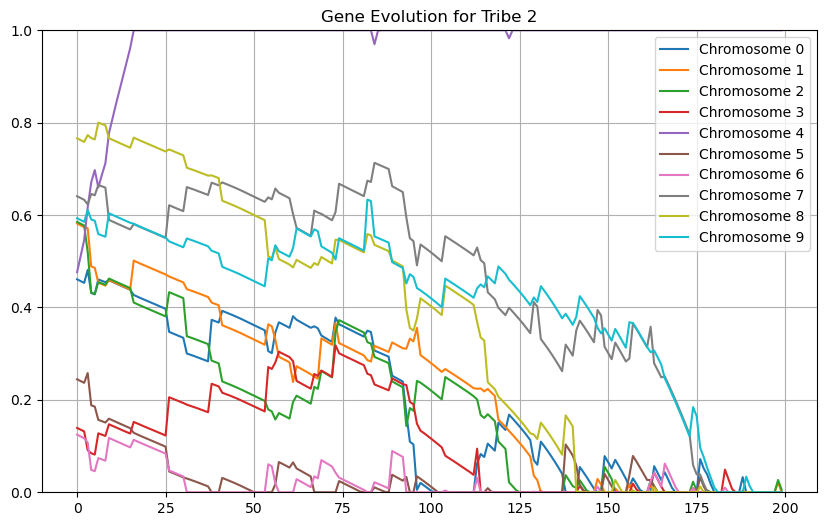

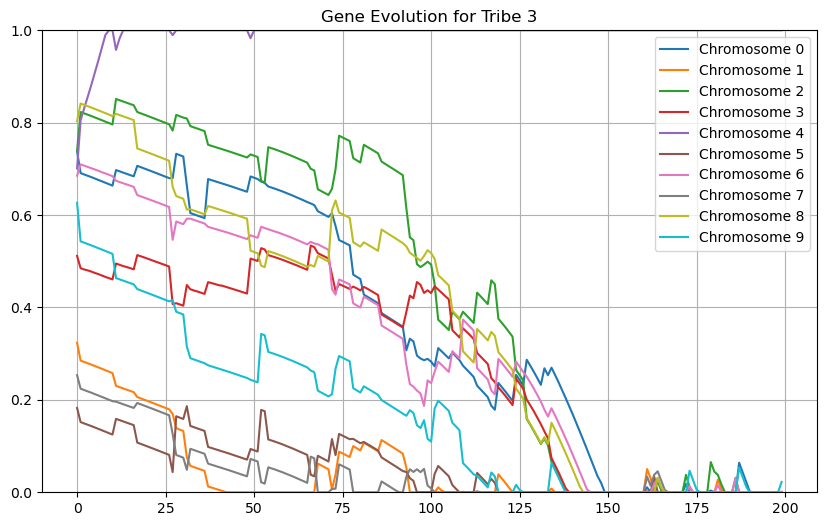

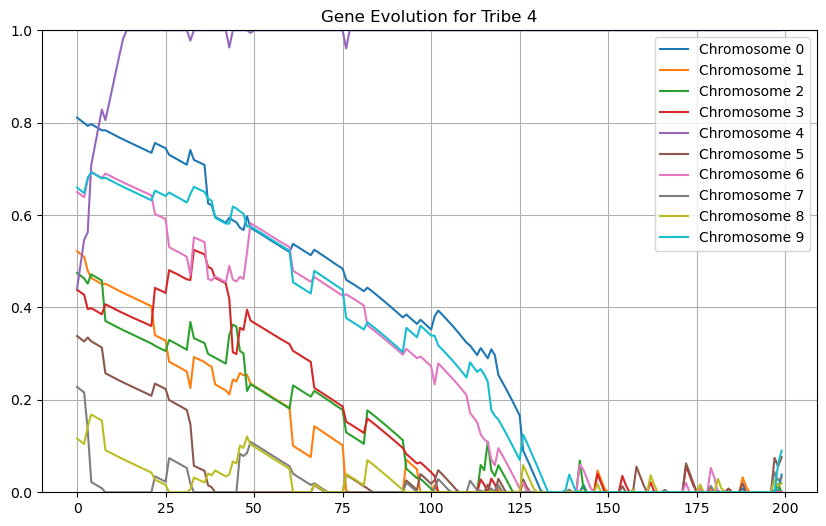

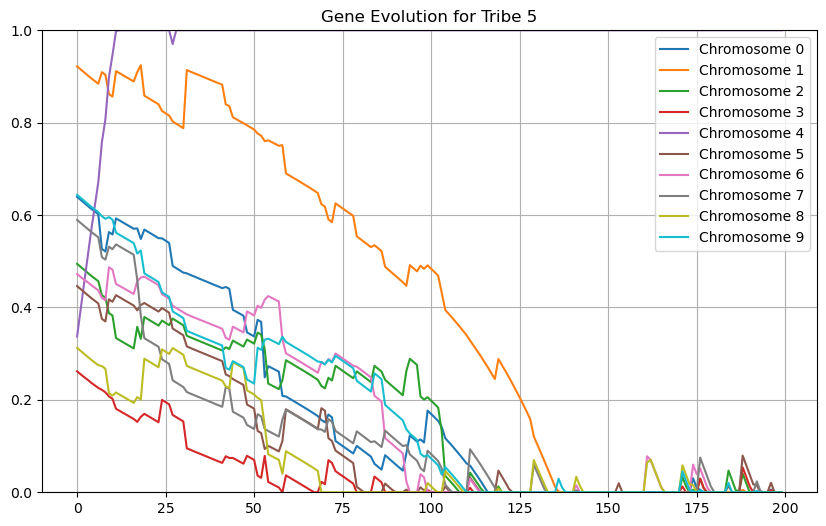

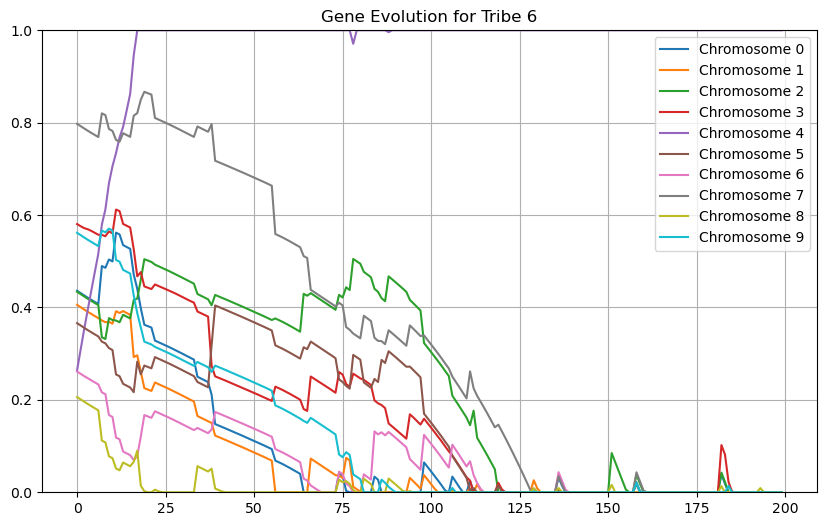

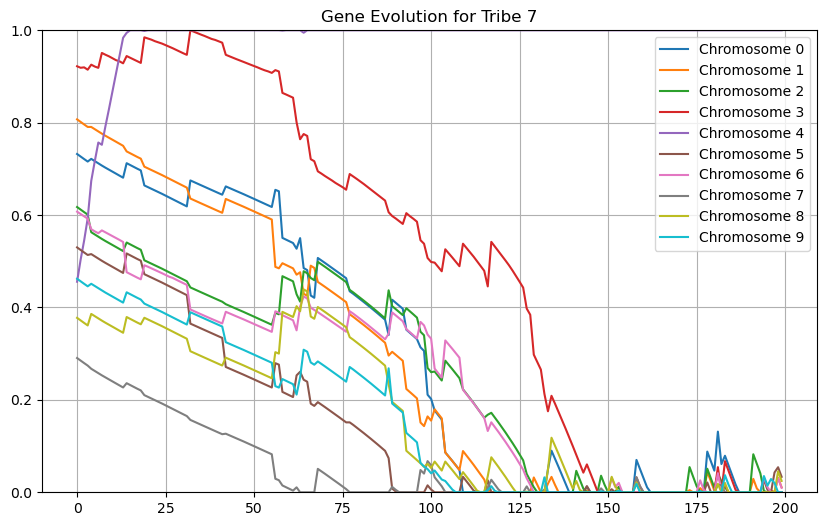

In [12]:
data200, instance200 = collect_and_visualize("../problems/p4.json", local_step_size=0.03, sigma=0.04)

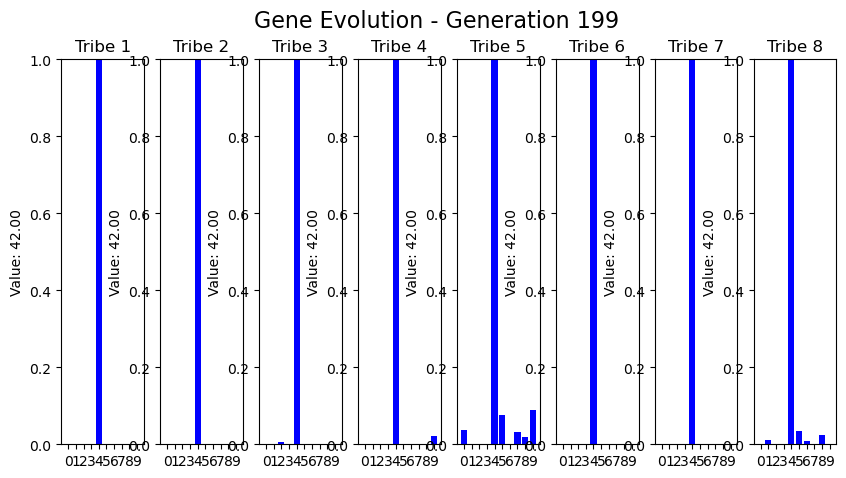

In [13]:
gene_displayer.visualize(data200)

In [14]:
solutions = correct_solutions(instance200)

In [15]:
best_solution_200, best_solutions_value_200 = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value_200}]:\n{best_solution_200}")

Best solution [4]:
[4]
